# Compare masks to cell segmentation

        CosMx cell segmentation
        CosMX GRIDGENE masks

        Xenium cell segmentation
        Xenium GRIDGENE masks

This notebook intends to provide a Quantitative Validation of Compartment Masks. For this,  we align GRIDGENE-generated cancer and stroma masks across CosMx and Xenium platforms comparing these masks to orthogonal cell segmentation & orthogonal annotations. 

In [2]:
%load_ext autoreload
%autoreload 2

import os 
import sys
import time
import logging
import re
from tqdm import tqdm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from natsort import natsorted
import json

import cv2
import numpy as np
from PIL import Image
import tifffile as tiff
import copy 
import random
from natsort import natsorted
import sys
from pathlib import Path
import re
from shapely.geometry import Polygon

# Add GRIDGENE root to path
# You need to go up 2 levels
gridgene_root = Path.cwd().parent.parent  # analyses/quantification -> analyses -> GRIDGENE
sys.path.insert(0, str(gridgene_root))

print(f"Added to path: {gridgene_root}")
print(f"gridgene package location: {gridgene_root / 'gridgene'}")
from gridgene import get_arrays as ga
from gridgene import contours 
from gridgene import get_masks
      
      

import sys
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tifffile
import cv2
from tqdm import tqdm

# Add GRIDGENE to path
gridgene_root = Path.cwd().parent.parent
sys.path.insert(0, str(gridgene_root))

# Import GRIDGENE modules
from gridgene import get_arrays as ga
from gridgene import contours, get_masks

# Import quantification modules
sys.path.append(str(Path.cwd().parent / 'scripts'))
from scripts.preprocessing import preprocess_if_image, register_masks_to_image
from scripts.metrics import calculate_overlap_metrics, calculate_enrichment

print("✓ Imports successful")
print(f"Working directory: {Path.cwd()}")
import pandas as pd
import seaborn as sns
from matplotlib.colors import ListedColormap
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import resize
from matplotlib.patches import Patch
import tifffile
import os
from natsort import natsorted
import copy
      
from scipy import ndimage
from skimage import morphology
import numpy as np
import matplotlib.pyplot as plt

from skimage import morphology
import cv2

Added to path: /home/martinha/PycharmProjects/phd/GRIDGENE
gridgene package location: /home/martinha/PycharmProjects/phd/GRIDGENE/gridgene
✓ Imports successful
Working directory: /home/martinha/PycharmProjects/phd/GRIDGENE/analyses/quantitative_validation


In [3]:
# define the logger :  can be None, and is set to INFO
# Custom logger setup
logger = logging.getLogger('contour_logger')
handler = logging.StreamHandler()
formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')
handler.setFormatter(formatter)
logger.addHandler(handler)
logger.setLevel(logging.INFO)

## CosMx 
We will start the quantitative analysis with CosMx data:
    - (1) Run gridgene pipeline
    - (2) Fetch cell segmentation (provided by Nanostring) and phenotyping.
    
Platform: CosMx (20 cores, 999 genes, IF reference)

To run the analysis more smoothly we will select 3 images from the CosMx cohort. Importantly, the overlay between both images would depend on the parametes used, meaning, depending on the degree of details, masks can become more smooth or more fine grained.

Path definition

In [10]:
# Base paths
cosmx_path_s0 = '/home/martinha/PycharmProjects/phd/spatial_transcriptomics/cosmx_data/S0/S0/20230628_151317_S4/AnalysisResults/iz38iruwno'
path_if = "/home/martinha/PycharmProjects/phd/spatial_transcriptomics/GRIDGEN/case_studies/PENGUINcomposites/"
cell_labels_base_path = Path('data')  # relative to notebook location
phenotype_csv_path = os.path.join(cell_labels_base_path,'CosMx_Slide1_S0_Annotated_Seurat_cell_labels_NanoString_segmentation.csv')
# '/home/martinha/PycharmProjects/phd/GRIDGENE/analyses/quantitative_validation/data/CosMx_Slide1_S0_Annotated_Seurat_cell_labels_NanoString_segmentation.csv'

# Define the FOVs you want
selected_fov_numbers = ['001', '005', '012']

# Build the comprehensive dictionary with all file paths
fov_data = {}
for fov_num in selected_fov_numbers:
    fov_name = f'FOV{fov_num}'
    cosmx_folder = os.path.join(cosmx_path_s0, fov_name)
    cosmx_file = None
    coord_file = None

    if os.path.isdir(cosmx_folder):
        for file in os.listdir(cosmx_folder):
            if '__target_call_coord.csv' in file and 'complete_code' not in file:
                cosmx_file = os.path.join(cosmx_folder, file)
            if '__complete_code_cell_target_call_coord.csv' in file:
                coord_file = os.path.join(cosmx_folder, file)

    fov_data[fov_name] = {
        'cosmx_path': cosmx_file,
        'coord_path': coord_file,
        'if_path': os.path.join(path_if, f"20230628_151317_S4_C902_P99_N99_F{fov_num}_composite.tiff"),
        'cell_labels_path': cell_labels_base_path / fov_name / f'CellLabels_F{fov_num}.tif',
        'comp_labels_path': cell_labels_base_path / fov_name / f'CompartmentLabels_F{fov_num}.tif',
    }

### 1.1 Run gridgene

In [6]:
def do_cosmx_pipeline(file_csv, target_tum, 
                     kernel_size_tum, density_th_tum, min_area_th_tum,
                     kernel_size_empty, density_th_empty, min_area_th_empty,
                     plot=False):
    """
    Generate GRIDGENE masks from CosMx CSV file
    
    Returns:
    --------
    dict: Contains masks and metadata
        - 'mask_tumor': tumor mask
        - 'mask_stroma': stroma mask  
        - 'mask_empty': empty mask
        - 'height': image height
        - 'width': image width
        - 'fov': FOV identifier
        - 'filename': input CSV filename
    """
    
    # Load and prepare data
    df_total = pd.read_csv(file_csv)
    df_total['X'] = (round(df_total['x'])).astype(int)
    df_total['Y'] = (round(df_total['y'])).astype(int)
    
    height = max(df_total['X']) + 1
    width = max(df_total['Y']) + 1
    
    target_dict_total = {target: index for index, target in enumerate(df_total['target'].unique())}
    
    # Create array
    array_total = ga.transform_df_to_array(
        df=df_total, 
        target_dict=target_dict_total, 
        array_shape=(height, width, len(target_dict_total))
    ).astype(np.int8)
    
    # Subset for tumor markers
    df_subset_tum, array_subset_tum, target_indices_subset_tum = ga.get_subset_arrays(
        df_total, array_total, target_dict_total,
        target_list=target_tum, target_col='target'
    )
    
    # Tumor contours
    CTum = contours.ConvolutionContours(array_subset_tum, contour_name='tum')
    CTum.get_conv_sum(kernel_size=kernel_size_tum, kernel_shape='square')
    CTum.contours_from_sum(
        density_threshold=density_th_tum,
        min_area_threshold=min_area_th_tum,
        directionality='higher'
    )
    
    # Empty region contours
    CEmpty = contours.ConvolutionContours(array_total, contour_name='empty')
    CEmpty.get_conv_sum(kernel_size=kernel_size_empty, kernel_shape='square')
    CEmpty.contours_from_sum(
        density_threshold=density_th_empty,
        min_area_threshold=min_area_th_empty,
        directionality='lower'
    )
    
    # Create masks
    GM = get_masks.GetMasks(image_shape=(height, width))
    
    mask_empty = GM.create_mask(CEmpty.contours)
    mask_tum = GM.create_mask(CTum.contours)
    mask_tum = GM.fill_holes(mask_tum)
    mask_stroma = GM.subtract_masks(
        np.ones((height, width), dtype=np.uint8), 
        mask_tum, 
        mask_empty
    )
    mask_stroma = GM.filter_binary_mask_by_area(mask_stroma, min_area=700)
    
    # Extract FOV identifier from filename
    # e.g., "FOV001_..." -> "FOV001"
    basename = os.path.basename(file_csv)
    fov_match = re.search(r'FOV\d{3}', basename)
    fov = fov_match.group(0) if fov_match else basename.split('_')[0]

    if plot:
        fig, axs = plt.subplots(1, 3, figsize=(18, 6))
        
        CTum.plot_contours_scatter(
            path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
            c_points='blue', c_contours='red', ax=axs[0]
        )
        axs[0].set_title(f'{fov}: Tumor Contours')
        
        CEmpty.plot_contours_scatter(
            path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
            c_points='blue', c_contours='red', ax=axs[1]
        )
        axs[1].set_title(f'{fov}: Empty Region Contours')
        
        GM.plot_masks(
            masks=[mask_stroma, mask_tum], 
            mask_names=['Stroma', 'Tumor'],
            background_color=(1, 1, 1), 
            mask_colors={'Stroma': (65, 105, 225), 'Tumor': (255, 165, 0)},
            path=None, show=False, ax=axs[2]
        )
        axs[2].set_title(f'{fov}: Final Masks')
        
        plt.tight_layout()
        plt.show()
    
    # Return dictionary with all info
    return {
        'mask_tumor': mask_tum,
        'mask_stroma': mask_stroma,
        'mask_empty': mask_empty,
        'height': height,
        'width': width,
        'fov': fov,
        'filename': file_csv
    }

print("GRIDGENE pipeline function defined (returns dict)")

GRIDGENE pipeline function defined (returns dict)



Processing FOV001...


2026-03-10 21:14:17,167 - gridgene.contours.tum - INFO - Initialized GetContour
2026-03-10 21:14:17,670 - gridgene.contours.tum - INFO - get_conv_sum took 0.5029 seconds
2026-03-10 21:14:18,022 - gridgene.contours.tum - INFO - Number of contours after filtering no counts: 38
2026-03-10 21:14:18,022 - gridgene.contours.tum - INFO - contours_from_sum took 0.3518 seconds
2026-03-10 21:14:18,023 - gridgene.contours.empty - INFO - Initialized GetContour
2026-03-10 21:14:26,484 - gridgene.contours.empty - INFO - get_conv_sum took 8.4609 seconds
2026-03-10 21:14:34,740 - gridgene.contours.empty - INFO - Number of contours after filtering no counts: 35
2026-03-10 21:14:34,741 - gridgene.contours.empty - INFO - contours_from_sum took 8.2563 seconds
2026-03-10 21:14:34,741 - gridgene.get_masks.GetMasks - INFO - Initialized GetMasks
2026-03-10 21:14:34,775 - gridgene.get_masks.GetMasks - INFO - Subtracted masks from base mask.


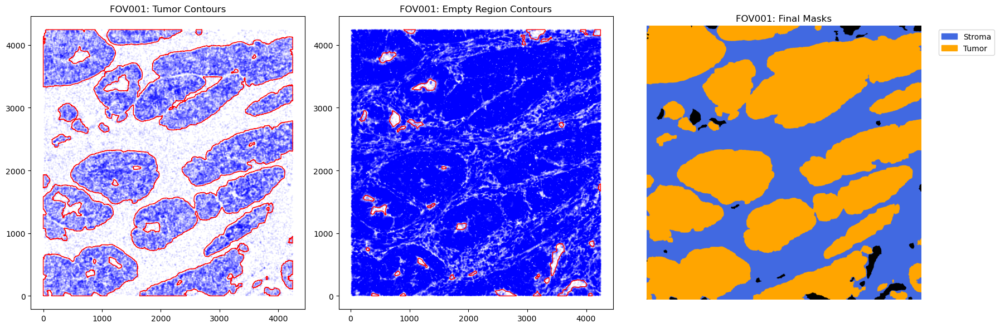

 Completed FOV001

Processing FOV005...


2026-03-10 21:14:53,374 - gridgene.contours.tum - INFO - Initialized GetContour
2026-03-10 21:14:53,858 - gridgene.contours.tum - INFO - get_conv_sum took 0.4841 seconds
2026-03-10 21:14:54,187 - gridgene.contours.tum - INFO - Number of contours after filtering no counts: 22
2026-03-10 21:14:54,187 - gridgene.contours.tum - INFO - contours_from_sum took 0.3287 seconds
2026-03-10 21:14:54,188 - gridgene.contours.empty - INFO - Initialized GetContour
2026-03-10 21:15:02,678 - gridgene.contours.empty - INFO - get_conv_sum took 8.4902 seconds
2026-03-10 21:15:10,941 - gridgene.contours.empty - INFO - Number of contours after filtering no counts: 71
2026-03-10 21:15:10,942 - gridgene.contours.empty - INFO - contours_from_sum took 8.2630 seconds
2026-03-10 21:15:10,942 - gridgene.get_masks.GetMasks - INFO - Initialized GetMasks
2026-03-10 21:15:10,976 - gridgene.get_masks.GetMasks - INFO - Subtracted masks from base mask.


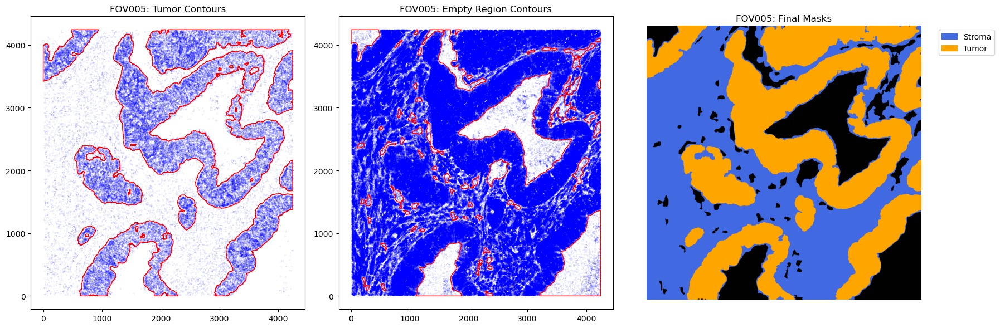

 Completed FOV005

Processing FOV012...


2026-03-10 21:15:29,828 - gridgene.contours.tum - INFO - Initialized GetContour
2026-03-10 21:15:30,316 - gridgene.contours.tum - INFO - get_conv_sum took 0.4875 seconds
2026-03-10 21:15:30,661 - gridgene.contours.tum - INFO - Number of contours after filtering no counts: 45
2026-03-10 21:15:30,662 - gridgene.contours.tum - INFO - contours_from_sum took 0.3450 seconds
2026-03-10 21:15:30,662 - gridgene.contours.empty - INFO - Initialized GetContour
2026-03-10 21:15:39,451 - gridgene.contours.empty - INFO - get_conv_sum took 8.7888 seconds
2026-03-10 21:15:48,028 - gridgene.contours.empty - INFO - Number of contours after filtering no counts: 36
2026-03-10 21:15:48,028 - gridgene.contours.empty - INFO - contours_from_sum took 8.5767 seconds
2026-03-10 21:15:48,029 - gridgene.get_masks.GetMasks - INFO - Initialized GetMasks
2026-03-10 21:15:48,074 - gridgene.get_masks.GetMasks - INFO - Subtracted masks from base mask.


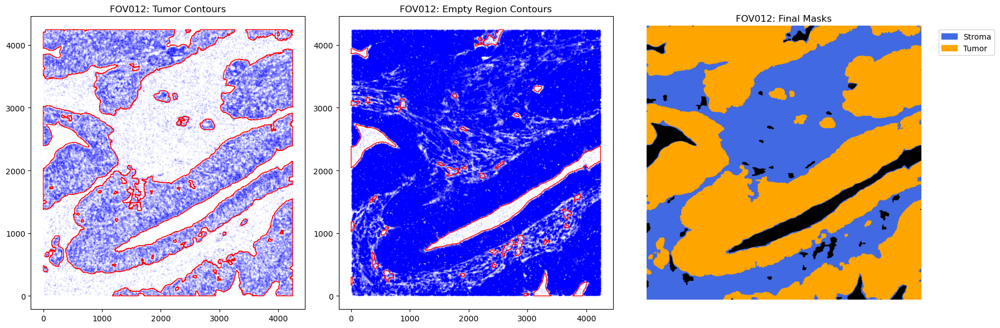

 Completed FOV012
FOV001: Tumor mask (4246, 4246), Stroma mask (4246, 4246),Empty mask (4246, 4246)
FOV005: Tumor mask (4246, 4246), Stroma mask (4246, 4246),Empty mask (4246, 4246)
FOV012: Tumor mask (4246, 4246), Stroma mask (4246, 4246),Empty mask (4246, 4246)


In [7]:
############## DEFINE PARAMETERS ##################

# param cancer
target_tum =  ['EPCAM',  'KRT19', 'KRT8', 'KRT18','KRT17','CEACAM6','SPINK1', 'CD24', 'S100A6','RPL37','S100P',]  
density_th_tum = 40    
min_area_th_tum =  1000 
kernel_size_tum = 80

# param empty
density_th_empty = 140
min_area_th_empty = 2000 
kernel_size_empty = 80

############# RUN GRIDGENE ###################
cosmx_results = []
for fov_name, paths in fov_data.items():
    print(f"\nProcessing {fov_name}...")
    
    result = do_cosmx_pipeline(
        paths['cosmx_path'],
        target_tum, 
        kernel_size_tum, density_th_tum, min_area_th_tum,
        kernel_size_empty, density_th_empty, min_area_th_empty,
        plot=True
    )

    result['fov'] = fov_name
    result['if_path'] = paths['if_path']
    
    cosmx_results.append(result)
    print(f" Completed {fov_name}")

for result in cosmx_results:
    print(f"{result['fov']}: Tumor mask {result['mask_tumor'].shape}, Stroma mask {result['mask_stroma'].shape},Empty mask {result['mask_empty'].shape}")

### 2.1. Compare GRIDGENE masks with cell segmentation 

In [20]:
def build_cell_rgb_image(cell_labels, pheno_fov, color_map):
    """
    Paint cell label mask with phenotype group colors.
    cell_labels: 2D array with integer cell IDs
    pheno_fov: df with columns cell_id, group
    color_map: dict {'Epithelial': [r,g,b], ...}
    """
    rgb = np.ones((*cell_labels.shape, 3))  # white background
    for _, row in pheno_fov.iterrows():
        color = color_map.get(row['group'], [0.8, 0.8, 0.8])
        rgb[cell_labels == row['cell_id']] = color
    return rgb


def build_disagree_image(cell_labels, pheno_fov, mask_tumor, mask_stroma, color_map):
    """
    Paint only disagreeing cells on white background.
    Disagreement: Epithelial in stroma, or Stromal/Immune in tumor.
    Returns rgb image and disagreement percentage.
    """
    rgb = np.ones((*cell_labels.shape, 3))  # white background
    
    n_disagree = 0
    for _, row in pheno_fov.iterrows():
        cell_mask = cell_labels == row['cell_id']
        tumor_overlap = (cell_mask & mask_tumor.astype(bool)).sum()
        stroma_overlap = (cell_mask & mask_stroma.astype(bool)).sum()
        
        if tumor_overlap > stroma_overlap:
            gg_compartment = 'tumor'
        else:
            gg_compartment = 'stroma'
        
        disagrees = (row['group'] == 'Epithelial' and gg_compartment == 'stroma') or \
                    (row['group'] in ['Stromal', 'Immune'] and gg_compartment == 'tumor')
        
        if disagrees:
            color = color_map.get(row['group'], [0.8, 0.8, 0.8])
            rgb[cell_mask] = color
            n_disagree += 1
    
    pct = n_disagree / len(pheno_fov) * 100 if len(pheno_fov) > 0 else 0
    return rgb, pct

def build_disagree_image(cell_labels, pheno_fov, mask_tumor, mask_stroma, color_map):
    rgb = np.ones((*cell_labels.shape, 3))
    
    # For each pixel, know if it's tumor or stroma
    # Then per cell_id, majority vote via bincount
    tumor_bool = mask_tumor.astype(np.uint8)
    stroma_bool = mask_stroma.astype(np.uint8)
    
    cell_ids = pheno_fov['cell_id'].values
    groups = dict(zip(pheno_fov['cell_id'].values, pheno_fov['group'].values))
    max_id = cell_labels.max() + 1
    
    # Sum tumor/stroma pixels per cell ID in one shot
    tumor_per_cell = np.bincount(cell_labels.ravel(), weights=tumor_bool.ravel(), minlength=max_id)
    stroma_per_cell = np.bincount(cell_labels.ravel(), weights=stroma_bool.ravel(), minlength=max_id)
    
    gg_compartment = np.where(tumor_per_cell > stroma_per_cell, 'tumor', 'stroma')
    
    n_disagree = 0
    for cell_id in cell_ids:
        group = groups[cell_id]
        gg = gg_compartment[cell_id]
        disagrees = (group == 'Epithelial' and gg == 'stroma') or \
                    (group in ['Stromal', 'Immune'] and gg == 'tumor')
        if disagrees:
            rgb[cell_labels == cell_id] = color_map.get(group, [0.8, 0.8, 0.8])
            n_disagree += 1
    
    pct = n_disagree / len(pheno_fov) * 100 if len(pheno_fov) > 0 else 0
    return rgb, pct

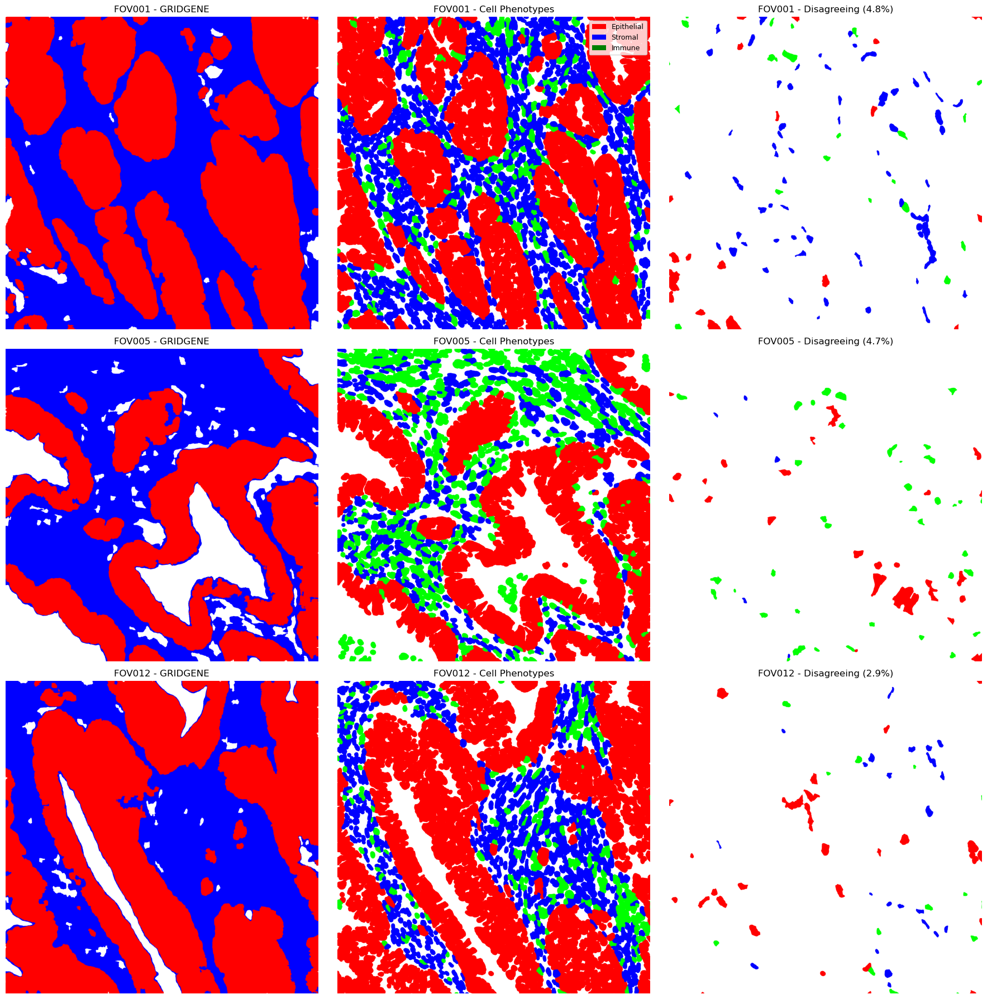

In [23]:
LABEL_GROUPS = {
    'Epithelial cells': 'Epithelial',
    'Stromal cells': 'Stromal',
    'T cells': 'Immune', 'Myeloid cells': 'Immune',
    'Plasma cells': 'Immune', 'Other cells': 'Immune', 'Granolocytes': 'Immune'
}
COLOR_MAP = {'Epithelial': [1,0,0], 'Stromal': [0,0,1], 'Immune': [0,1,0]}

pheno_df = pd.read_csv(phenotype_csv_path)
pheno_df['fov_num'] = pheno_df['Cells'].str.split('_').str[2].astype(int)
pheno_df['cell_id'] = pheno_df['Cells'].str.split('_').str[3].astype(int)
pheno_df['group'] = pheno_df['Final_label'].map(LABEL_GROUPS)

def plot_cell_gridgene_comparison(cosmx_results, pheno_df, fov_data, color_map, show_immune=True, save_path=None):
    
    groups = ['Epithelial', 'Stromal'] + (['Immune'] if show_immune else [])
    
    fig, axes = plt.subplots(len(cosmx_results), 3, figsize=(18, 6*len(cosmx_results)))
    
    for idx, result in enumerate(cosmx_results):
        fov_name = result['fov']
        fov_num = int(fov_name.replace('FOV', ''))
        mask_tumor = result['mask_tumor']
        mask_stroma = result['mask_stroma']
        h, w = mask_tumor.shape

        # Load and transform cell labels
        cell_labels = tiff.imread(fov_data[fov_name]['cell_labels_path'])
        cell_labels = np.rot90(np.flipud(cell_labels), -1)[:h, :w]
        
        pheno_fov = pheno_df[pheno_df['fov_num'] == fov_num][['cell_id', 'group']]
        if not show_immune:
            pheno_fov = pheno_fov[pheno_fov['group'] != 'Immune']

        # GRIDGENE rgb
        gg_rgb = np.ones((h, w, 3))
        gg_rgb[mask_tumor == 1] = [1, 0, 0]
        gg_rgb[mask_stroma == 1] = [0, 0, 1]

        cell_rgb = build_cell_rgb_image(cell_labels, pheno_fov, color_map)
        disagree_rgb, pct = build_disagree_image(cell_labels, pheno_fov, mask_tumor, mask_stroma, color_map)

        axes[idx, 0].imshow(gg_rgb)
        axes[idx, 0].set_title(f'{fov_name} - GRIDGENE')
        axes[idx, 0].axis('off')

        axes[idx, 1].imshow(cell_rgb)
        axes[idx, 1].set_title(f'{fov_name} - Cell Phenotypes')
        axes[idx, 1].axis('off')

        axes[idx, 2].imshow(disagree_rgb)
        axes[idx, 2].set_title(f'{fov_name} - Disagreeing ({pct:.1f}%)')
        axes[idx, 2].axis('off')

        if idx == 0:
            legend = [Patch(facecolor='red', label='Epithelial'),
                      Patch(facecolor='blue', label='Stromal')]
            if show_immune:
                legend.append(Patch(facecolor='green', label='Immune'))
            axes[idx, 1].legend(handles=legend, loc='upper right', fontsize=9)

    plt.tight_layout()
#     if save_path:
#         plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()

plot_cell_gridgene_comparison(cosmx_results, pheno_df, fov_data, COLOR_MAP, show_immune=True,
                              save_path='figures/cell_gridgene_validation.png')

In [27]:
def map_cells_to_gridgene_masks(fov_data, pheno_df, cosmx_results):
    """
    For each FOV, compute cell centroids from coord file,
    join with phenotypes, and assign each cell to a GRIDGENE mask.
    """
    # Prepare phenotype df
    pheno_df['fov_num'] = pheno_df['Cells'].str.split('_').str[2].astype(int)
    pheno_df['cell_id'] = pheno_df['Cells'].str.split('_').str[3].astype(int)
    
    # Build gridgene masks lookup by fov_name
    gg_by_fov = {r['fov']: r for r in cosmx_results}
    
    all_results = []
    
    for fov_name, paths in fov_data.items():
        fov_num = int(fov_name.replace('FOV', ''))
        print(f"{fov_name}...", end=" ")
        
        # Load coord file and compute centroids
        coord_df = pd.read_csv(paths['coord_path'])
        centroids = coord_df[coord_df['CellId'] > 0].groupby('CellId')[['x','y']].mean().reset_index()
        
        # Filter phenotypes for this FOV
        pheno_fov = pheno_df[pheno_df['fov_num'] == fov_num][['cell_id', 'Final_label']]
        
        # Join
        merged = centroids.merge(pheno_fov, left_on='CellId', right_on='cell_id', how='inner')
        print(f"{len(merged)} cells with phenotypes", end=" ")
        
        # Get GRIDGENE masks
        gg = gg_by_fov[fov_name]
        mask_tumor = gg['mask_tumor']
        mask_stroma = gg['mask_stroma']
        mask_empty = gg['mask_empty']
        
        # Assign each cell to a mask based on centroid
        def get_compartment(x, y):
            xi, yi = int(round(x)), int(round(y))
            # bounds check
            if xi < 0 or yi < 0 or xi >= mask_tumor.shape[0] or yi >= mask_tumor.shape[1]:
                return 'outside'
            if mask_tumor[xi, yi] == 1:
                return 'tumor'
            elif mask_stroma[xi, yi] == 1:
                return 'stroma'
            elif mask_empty[xi, yi] == 1:
                return 'empty'
            return 'unassigned'
        
        merged['gridgene_compartment'] = merged.apply(lambda r: get_compartment(r['x'], r['y']), axis=1)
        merged['fov'] = fov_name
        all_results.append(merged)
        print(f"✓")
    
    return pd.concat(all_results, ignore_index=True)

cell_df = map_cells_to_gridgene_masks(fov_data, pheno_df, cosmx_results)
print(cell_df['gridgene_compartment'].value_counts())
print(cell_df['Final_label'].value_counts())

FOV001... 2714 cells with phenotypes ✓
FOV005... 2084 cells with phenotypes ✓
FOV012... 2871 cells with phenotypes ✓
gridgene_compartment
tumor         4419
stroma        3152
empty           97
unassigned       1
Name: count, dtype: int64
Final_label
Epithelial cells    4294
Stromal cells       2300
T cells              438
Myeloid cells        391
Plasma cells         148
Other cells           60
Granolocytes          38
Name: count, dtype: int64


In [28]:
print(pd.crosstab(cell_df['Final_label'], cell_df['gridgene_compartment'], normalize='index').round(2))

gridgene_compartment  empty  stroma  tumor  unassigned
Final_label                                           
Epithelial cells       0.00    0.02   0.98         0.0
Granolocytes           0.08    0.82   0.11         0.0
Myeloid cells          0.01    0.96   0.03         0.0
Other cells            0.72    0.15   0.13         0.0
Plasma cells           0.01    0.99   0.00         0.0
Stromal cells          0.01    0.93   0.06         0.0
T cells                0.01    0.84   0.15         0.0


First lets download the cell masks and phenotyping

In [53]:
def plot_cell_compartment_distribution(cell_df, output_path=None, title_prefix="", colors=None):
    if colors is None:
        colors = {'tumor': '#e74c3c', 'stroma': '#3498db', 'empty': '#95a5a6'}

    df = cell_df[cell_df['gridgene_compartment'].isin(['tumor', 'stroma', 'empty'])].copy()

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    # --- Panel 1: Aggregated stacked bar ---
    agg = df.groupby(['group', 'gridgene_compartment']).size().unstack(fill_value=0)
    agg = agg.div(agg.sum(axis=1), axis=0) * 100
    agg[['tumor', 'stroma', 'empty']].plot(
        kind='bar', stacked=True, ax=axes[0],
        color=[colors['tumor'], colors['stroma'], colors['empty']],
        edgecolor='white', linewidth=0.5
    )
    axes[0].set_title(f'{title_prefix}Aggregated', fontweight='bold')
    axes[0].set_ylabel('% of cells')
    axes[0].set_xlabel('')
    axes[0].tick_params(axis='x', rotation=30)
    axes[0].legend(title='', frameon=False, loc='upper right')
    axes[0].set_ylim(0, 115)

    # --- Panel 2: % in tumor heatmap ---
    fov_pct = df.groupby(['fov', 'group', 'gridgene_compartment']).size().unstack(fill_value=0)
    fov_pct = fov_pct.div(fov_pct.sum(axis=1), axis=0) * 100
    fov_pct = fov_pct.reset_index()

    tumor_pct = fov_pct.pivot(index='group', columns='fov', values='tumor')
    stroma_pct = fov_pct.pivot(index='group', columns='fov', values='stroma')

    sns.heatmap(tumor_pct, annot=True, fmt='.1f', cmap='Reds',
                vmin=0, vmax=100, ax=axes[1],
                linewidths=0.5, linecolor='white',
                cbar_kws={'label': '% in tumor'})
    axes[1].set_title(f'{title_prefix}% in Tumor per FOV', fontweight='bold')
    axes[1].set_xlabel('')
    axes[1].set_ylabel('')

    # --- Panel 3: % in stroma heatmap ---
    sns.heatmap(stroma_pct, annot=True, fmt='.1f', cmap='Blues',
                vmin=0, vmax=100, ax=axes[2],
                linewidths=0.5, linecolor='white',
                cbar_kws={'label': '% in stroma'})
    axes[2].set_title(f'{title_prefix}% in Stroma per FOV', fontweight='bold')
    axes[2].set_xlabel('')
    axes[2].set_ylabel('')

    plt.tight_layout()
    if output_path:
        ensure_output_dir(output_path)
        plt.savefig(output_path, dpi=300, bbox_inches='tight')
    plt.show()
    
def plot_cell_compartment_heatmaps(cell_df, output_path=None, title_prefix="", colors=None):
    """
    Two heatmaps: % in tumor and % in stroma per cell type and FOV.
    """
    df = cell_df[cell_df['gridgene_compartment'].isin(['tumor', 'stroma', 'empty'])].copy()

    fov_pct = df.groupby(['fov', 'group', 'gridgene_compartment']).size().unstack(fill_value=0)
    fov_pct = fov_pct.div(fov_pct.sum(axis=1), axis=0) * 100
    fov_pct = fov_pct.reset_index()

    tumor_pct = fov_pct.pivot(index='group', columns='fov', values='tumor')
    stroma_pct = fov_pct.pivot(index='group', columns='fov', values='stroma')

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    sns.heatmap(tumor_pct, annot=True, fmt='.1f', cmap='Reds',
                vmin=0, vmax=100, ax=axes[0],
                linewidths=0.5, linecolor='white',
                cbar_kws={'label': '% in tumor'})
    axes[0].set_title(f'{title_prefix}% Cells in Tumor', fontweight='bold')
    axes[0].set_xlabel('')
    axes[0].set_ylabel('')

    sns.heatmap(stroma_pct, annot=True, fmt='.1f', cmap='Blues',
                vmin=0, vmax=100, ax=axes[1],
                linewidths=0.5, linecolor='white',
                cbar_kws={'label': '% in stroma'})
    axes[1].set_title(f'{title_prefix}% Cells in Stroma', fontweight='bold')
    axes[1].set_xlabel('')
    axes[1].set_ylabel('')

    plt.tight_layout()
    if output_path:
        ensure_output_dir(output_path)
        plt.savefig(output_path, dpi=300, bbox_inches='tight')
    plt.show()
# plot_cell_compartment_heatmaps(cell_df, title_prefix='CosMx: ')

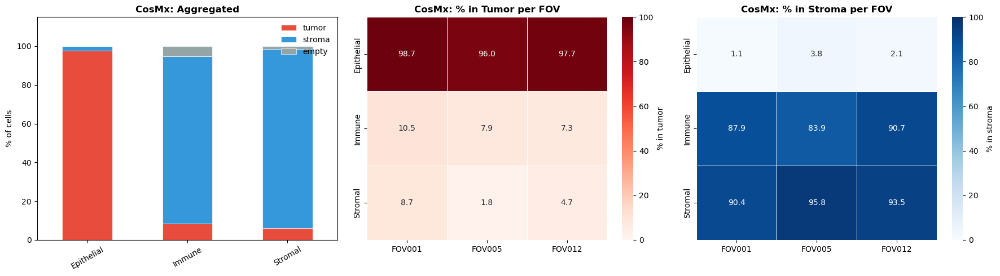

In [56]:
# from scripts.plotting_utils import plot_cell_compartment_distribution
plot_cell_compartment_distribution(cell_df, output_path=None, title_prefix='CosMx: ', colors=None)

## Xenium

We will now do the same quantitative analysis but this time with Xenium data. Importantly we only have 3 cores matching Imaging Mass Cytometry (IMC) experiments. We will 
    - (1) Run gridgene pipeline on Xenium;
    - (2) Fetch cell segmentation (done with Baysor - https://doi.org/10.1038/s41587-021-01044-w) and phenotyping.

Importantly, the overlay between both images would depend on the parametes used in gridgene, meaning, depending on the degree of details, masks can become more smooth or more fine grained.

Define Paths

In [57]:
# ============================================================================
# XENIUM + IMC CONFIGURATION
# ============================================================================

# Base paths
xenium_base_path = '/home/martinha/PycharmProjects/phd/spatial_transcriptomics/xenium_data/HLA/GD_TMA1_S3/fov_filtered'

imc_base_path = "/home/martinha/PycharmProjects/phd/spatial_transcriptomics/GRIDGEN/case_studies/PENGUINcompositesIMC"
baysor_base_path_xenium = '/home/martinha/PycharmProjects/phd/spatial_transcriptomics/xenium/HLA_analysis/cell_segmentation/cells_prior07'

# Shared files (same for all ROIs)
phenotype_h5ad_path = '/home/martinha/PycharmProjects/phd/spatial_transcriptomics/xenium/HLA_analysis/cell_prior07_v20_03.h5ad'
selection_coords_path = '/home/martinha/PycharmProjects/phd/spatial_transcriptomics/xenium_data/HLA/GD_TMA1_S3/coordinates_HLA1.csv'

# ROI to Selection mapping
roi_to_selection = {
    'ROI001': 'Selection8',
    'ROI002': 'Selection32',
    'ROI003': 'Selection13'
}

# Build the ROI data dictionary
roi_data = {
    'ROI001': {
        'xenium_path': os.path.join(xenium_base_path, 'TMA1_Selection8_filtered.csv'),
        'imc_path': os.path.join(imc_base_path, 'ROI001_ROI_001.ome.tiff'),
        'baysor_folder': os.path.join(baysor_base_path_xenium, 'TMA1_Selection8'),
        'baysor_json': os.path.join(baysor_base_path_xenium, 'TMA1_Selection8', 'segmentation_polygons.json'),
        'selection_name': 'Selection8'
    },
    'ROI002': {
        'xenium_path': os.path.join(xenium_base_path, 'TMA1_Selection32_filtered.csv'),
        'imc_path': os.path.join(imc_base_path, 'ROI002_ROI_002.ome.tiff'),
        'baysor_folder': os.path.join(baysor_base_path_xenium, 'TMA1_Selection32'),
        'baysor_json': os.path.join(baysor_base_path_xenium, 'TMA1_Selection32', 'segmentation_polygons.json'),
        'selection_name': 'Selection32'
    },
    'ROI003': {
        'xenium_path': os.path.join(xenium_base_path, 'TMA1_Selection13_filtered.csv'),
        'imc_path': os.path.join(imc_base_path, 'ROI003_ROI_003.ome.tiff'),
        'baysor_folder': os.path.join(baysor_base_path_xenium, 'TMA1_Selection13'),
        'baysor_json': os.path.join(baysor_base_path_xenium, 'TMA1_Selection13', 'segmentation_polygons.json'),
        'selection_name': 'Selection13'
    }
}

### 2.1. Run gridgene

In [58]:
def do_xenium_pipeline(file_csv, target_tum, 
                     kernel_size_tum, density_th_tum, min_area_th_tum,
                     kernel_size_empty, density_th_empty, min_area_th_empty,
                     plot=False):
    """
    Generate GRIDGENE masks from CosMx CSV file
    
    Returns:
    --------
    dict: Contains masks and metadata
        - 'mask_tumor': tumor mask
        - 'mask_stroma': stroma mask  
        - 'mask_empty': empty mask
        - 'height': image height
        - 'width': image width
        - 'fov': FOV identifier
        - 'filename': input CSV filename
    """
    
    # Load and prepare data   --- only this part is different from CosMx join both 
    df_total = pd.read_csv(file_csv)
    df_total = df_total[['x_location', 'y_location', 'feature_name']]
    df_total = df_total.rename(columns={'feature_name': 'target'})
    df_total = df_total[~df_total['target'].str.contains('System|egative')]
    df_total['X'] = df_total['x_location'] - min(df_total['x_location'])
    df_total['Y'] = df_total['y_location'] - min(df_total['y_location'])
    
    n_genes = len(df_total['target'].unique())
    height = int(max(df_total['X'])) + 1
    width = int(max(df_total['Y'])) + 1
    
    target_dict_total = {target: index for index, target in enumerate(df_total['target'].unique())}
    
    # Create array
    array_total = ga.transform_df_to_array(
        df=df_total, 
        target_dict=target_dict_total, 
        array_shape=(height, width, len(target_dict_total))
    ).astype(np.int8)
    
    # Subset for tumor markers
    df_subset_tum, array_subset_tum, target_indices_subset_tum = ga.get_subset_arrays(
        df_total, array_total, target_dict_total,
        target_list=target_tum, target_col='target'
    )
    
    # Tumor contours
    CTum = contours.ConvolutionContours(array_subset_tum, contour_name='tum')
    CTum.get_conv_sum(kernel_size=kernel_size_tum, kernel_shape='square')
    CTum.contours_from_sum(
        density_threshold=density_th_tum,
        min_area_threshold=min_area_th_tum,
        directionality='higher'
    )
    
    # Empty region contours
    CEmpty = contours.ConvolutionContours(array_total, contour_name='empty')
    CEmpty.get_conv_sum(kernel_size=kernel_size_empty, kernel_shape='square')
    CEmpty.contours_from_sum(
        density_threshold=density_th_empty,
        min_area_threshold=min_area_th_empty,
        directionality='lower'
    )
    
    # Create masks
    GM = get_masks.GetMasks(image_shape=(height, width))
    
    mask_empty = GM.create_mask(CEmpty.contours)
    mask_tum = GM.create_mask(CTum.contours)
    mask_tum = GM.fill_holes(mask_tum)
    mask_stroma = GM.subtract_masks(
        np.ones((height, width), dtype=np.uint8), 
        mask_tum, 
        mask_empty
    )
    mask_stroma = GM.filter_binary_mask_by_area(mask_stroma, min_area=700)
    
    basename = os.path.basename(file_csv)
    fov_match = re.search(r'FOV\d{3}', basename)
    fov = fov_match.group(0) if fov_match else basename.split('_')[0]

    if plot:
        fig, axs = plt.subplots(1, 3, figsize=(18, 6))
        
        CTum.plot_contours_scatter(
            path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
            c_points='blue', c_contours='red', ax=axs[0]
        )
        axs[0].set_title(f'{fov}: Tumor Contours')
        
        CEmpty.plot_contours_scatter(
            path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
            c_points='blue', c_contours='red', ax=axs[1]
        )
        axs[1].set_title(f'{fov}: Empty Region Contours')
        
        GM.plot_masks(
            masks=[mask_stroma, mask_tum], 
            mask_names=['Stroma', 'Tumor'],
            background_color=(1, 1, 1), 
            mask_colors={'Stroma': (65, 105, 225), 'Tumor': (255, 165, 0)},
            path=None, show=False, ax=axs[2]
        )
        axs[2].set_title(f'{fov}: Final Masks')
        
        plt.tight_layout()
        plt.show()
    
    # Return dictionary with all info
    return {
        'mask_tumor': mask_tum,
        'mask_stroma': mask_stroma,
        'mask_empty': mask_empty,
        'height': height,
        'width': width,
        'filename': file_csv
    }


Processing ROI001...


2026-03-10 23:55:33,566 - gridgene.contours.tum - INFO - Initialized GetContour
2026-03-10 23:55:33,627 - gridgene.contours.tum - INFO - get_conv_sum took 0.0608 seconds
2026-03-10 23:55:33,680 - gridgene.contours.tum - INFO - Number of contours after filtering no counts: 14
2026-03-10 23:55:33,680 - gridgene.contours.tum - INFO - contours_from_sum took 0.0525 seconds
2026-03-10 23:55:33,681 - gridgene.contours.empty - INFO - Initialized GetContour
2026-03-10 23:55:34,199 - gridgene.contours.empty - INFO - get_conv_sum took 0.5179 seconds
2026-03-10 23:55:34,751 - gridgene.contours.empty - INFO - Number of contours after filtering no counts: 3
2026-03-10 23:55:34,752 - gridgene.contours.empty - INFO - contours_from_sum took 0.5523 seconds
2026-03-10 23:55:34,752 - gridgene.get_masks.GetMasks - INFO - Initialized GetMasks
2026-03-10 23:55:34,776 - gridgene.get_masks.GetMasks - INFO - Subtracted masks from base mask.


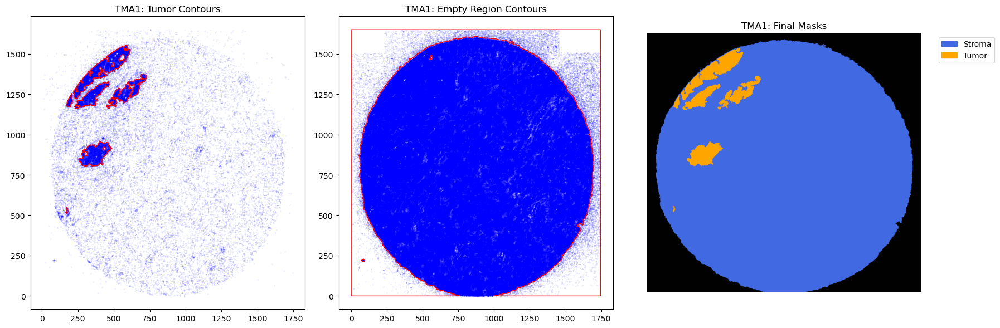

 Completed ROI001

Processing ROI002...


2026-03-10 23:55:37,885 - gridgene.contours.tum - INFO - Initialized GetContour
2026-03-10 23:55:37,941 - gridgene.contours.tum - INFO - get_conv_sum took 0.0559 seconds
2026-03-10 23:55:37,997 - gridgene.contours.tum - INFO - Number of contours after filtering no counts: 2
2026-03-10 23:55:37,998 - gridgene.contours.tum - INFO - contours_from_sum took 0.0562 seconds
2026-03-10 23:55:37,998 - gridgene.contours.empty - INFO - Initialized GetContour
2026-03-10 23:55:38,615 - gridgene.contours.empty - INFO - get_conv_sum took 0.6161 seconds
2026-03-10 23:55:39,226 - gridgene.contours.empty - INFO - Number of contours after filtering no counts: 237
2026-03-10 23:55:39,227 - gridgene.contours.empty - INFO - contours_from_sum took 0.6117 seconds
2026-03-10 23:55:39,227 - gridgene.get_masks.GetMasks - INFO - Initialized GetMasks
2026-03-10 23:55:39,233 - gridgene.get_masks.GetMasks - INFO - Subtracted masks from base mask.


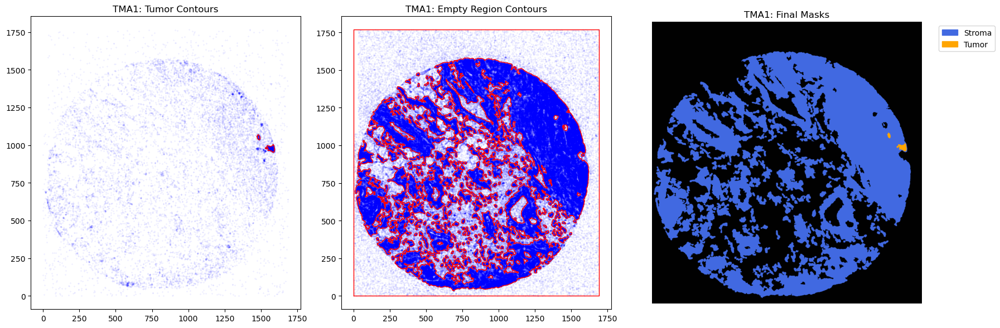

 Completed ROI002

Processing ROI003...


2026-03-10 23:55:46,836 - gridgene.contours.tum - INFO - Initialized GetContour
2026-03-10 23:55:46,903 - gridgene.contours.tum - INFO - get_conv_sum took 0.0669 seconds
2026-03-10 23:55:46,985 - gridgene.contours.tum - INFO - Number of contours after filtering no counts: 68
2026-03-10 23:55:46,986 - gridgene.contours.tum - INFO - contours_from_sum took 0.0822 seconds
2026-03-10 23:55:46,986 - gridgene.contours.empty - INFO - Initialized GetContour
2026-03-10 23:55:47,688 - gridgene.contours.empty - INFO - get_conv_sum took 0.7019 seconds
2026-03-10 23:55:48,371 - gridgene.contours.empty - INFO - Number of contours after filtering no counts: 34
2026-03-10 23:55:48,371 - gridgene.contours.empty - INFO - contours_from_sum took 0.6823 seconds
2026-03-10 23:55:48,371 - gridgene.get_masks.GetMasks - INFO - Initialized GetMasks
2026-03-10 23:55:48,381 - gridgene.get_masks.GetMasks - INFO - Subtracted masks from base mask.


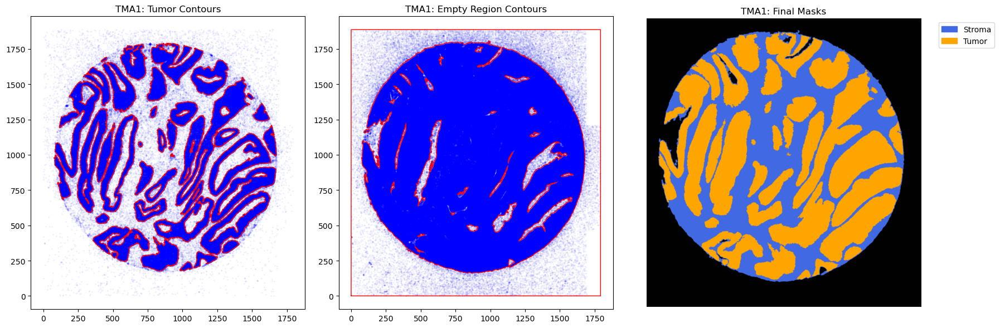

 Completed ROI003


In [59]:
############## DEFINE PARAMETERS ##################

# param tum
target_tum = ['EPCAM', 'SMIM22','CLDN3', 'KRT18','LGALS4', 'KRT8', 'ELF3','TSPAN8', 'STMN1', 'CD47', 'MYC', 'LGALS3'] 
# density_th_tum = 20    # 50
# min_area_th_tum =  700 #1000     check how much is a cell 
# kernel_size_tum = 10   # 20

# # param empty
# density_th_empty = 30
# min_area_th_empty = 400 #400
# kernel_size_empty = 10

density_th_tum = 5    # 50
min_area_th_tum =  200 #1000     check how much is a cell 
kernel_size_tum = 5   # 20

# param empty
density_th_empty = 20
min_area_th_empty = 200 #400
kernel_size_empty = 10

############# RUN GRIDGENE ###################
xenium_results = {}
for fov_name, paths in roi_data.items():
    print(f"\nProcessing {fov_name}...")
    
    result = do_xenium_pipeline(
        paths['xenium_path'],
        target_tum, 
        kernel_size_tum, density_th_tum, min_area_th_tum,
        kernel_size_empty, density_th_empty, min_area_th_empty,
        plot=True
    )

    result['fov'] = fov_name
    
    xenium_results[fov_name] = result
    print(f" Completed {fov_name}")

### 2.2 Compare Gridgene masks with cell segmentation

In [60]:
%autoreload
# ============================================================================
# CELL-LEVEL VALIDATION NOTEBOOK
# ============================================================================

# Import cell validation functions
import scanpy as sc
from scripts.cell_phenotype_validation import (
    COMPARTMENT_MAPPING,
    load_baysor_polygons,
    map_phenotypes_to_polygons_xenium,
    analyze_cell_phenotype_distribution,
    create_distribution_dataframe,
    visualize_cell_phenotypes,
    plot_distribution_boxplot,
    plot_distribution_barplot,
    plot_confusion_heatmap,
    plot_comprehensive_figure
)

# Load AnnData and coordinates
adata = sc.read_h5ad(phenotype_h5ad_path)
# Create Xenium compartment mapping
COMPARTMENT_MAPPING_XENIUM = {
    'Epithelial': 'tumor',
    'Stroma-Fibroblasts': 'stroma',
    'Stroma-Myofibroblasts_vsmc': 'stroma',
    'Stroma-Tip-vascular': 'stroma',
    'Stroma-Pericytes': 'stroma',
    'Stroma-Glia': 'stroma',
    'Immune-Myeloid': 'immune',
    'Immune-Tcell': 'immune',
    'Immune-PlasmaB': 'immune',
    'Immune-Bcell': 'immune',
    'Immune-undefined': 'immune',
    'Immune-contaminated': 'other',
}

# Apply mapping
adata.obs['compartment'] = adata.obs['annotation_level2'].map(COMPARTMENT_MAPPING_XENIUM)
adata.obs['cellID'] = adata.obs['Name'].str.split('-').str[1].astype(int)

# Extract numeric cell ID from Name
adata.obs['cell_id_numeric'] = adata.obs['Name'].str.split('-').str[1].astype(int)
adata_selection = adata[adata.obs['TMA']=='TMA1']
print(len(adata_selection))
coordinates_all = pd.read_csv(selection_coords_path)

# Process all ROIs
cell_phenotype_results = {}

for roi_name, paths in roi_data.items():
    print(f"{roi_name}...", end=" ")
    
    if paths['baysor_json'] is None:
        print("✗ No Baysor data")
        continue
    
    try:
        # Get coordinate offsets
        selection_num = paths['selection_name'].replace('Selection', '').strip()
        coords = coordinates_all[coordinates_all['Selection'] == f'Selection {selection_num}']
        min_x = coords['X'].min()
        min_y = coords['Y'].min()

        adata_selection_ = adata_selection[adata_selection.obs['Selection'] == f'Selection {selection_num}']
        # Load polygons
        polygons = load_baysor_polygons(paths['baysor_folder'])
        
        # Map phenotypes with coordinate shifting
        cell_phenotypes = map_phenotypes_to_polygons_xenium(
            polygons, 
            adata_selection_, 
            paths['selection_name'],
            min_x,
            min_y
        )
        
        cell_phenotype_results[roi_name] = {
            'success': True,
            'cell_phenotypes': cell_phenotypes,
            'n_cells': len(cell_phenotypes)
        }
        
        print(f"✓ {len(cell_phenotypes)} cells")
        
    except Exception as e:
        print(f"✗ {e}")
        cell_phenotype_results[roi_name] = {'success': False} 

326342
ROI001...   (68 polygons skipped) ✓ 7344 cells
ROI002...   (53 polygons skipped) ✓ 7551 cells
ROI003...   (237 polygons skipped) ✓ 19691 cells


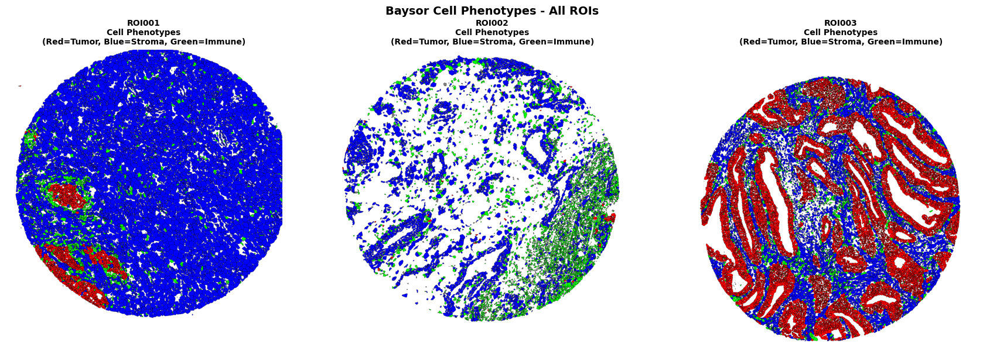

In [61]:
# Just show cell phenotypes for all 3 ROIs in one row
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for idx, roi_name in enumerate(['ROI001', 'ROI002', 'ROI003']):
    if not cell_phenotype_results.get(roi_name, {}).get('success', False):
        axes[idx].text(0.5, 0.5, f'{roi_name}\nNo data', ha='center', va='center')
        axes[idx].axis('off')
        continue
    
    cell_phenotypes = cell_phenotype_results[roi_name]['cell_phenotypes']
    gg = xenium_results[roi_name]
    image_shape = gg['mask_tumor'].shape
    
    # Create phenotype image
    cell_phenotype_img = np.ones((*image_shape, 3), dtype=np.uint8) * 255
    colors = {
        'tumor': (255, 0, 0),
        'stroma': (0, 0, 255),
        'immune': (0, 255, 0),
        'other': (128, 128, 128)
    }
    
    for _, row in cell_phenotypes.iterrows():
        if pd.isna(row['compartment']):
            continue
        color = colors.get(row['compartment'], (128, 128, 128))
        coords = np.array(row['polygon'].exterior.coords, dtype=np.int32)
        cv2.fillPoly(cell_phenotype_img, [coords], color)
        cv2.polylines(cell_phenotype_img, [coords], isClosed=True, color=(0, 0, 0), thickness=1)
    
    axes[idx].imshow(cell_phenotype_img)
    axes[idx].set_title(f'{roi_name}\nCell Phenotypes\n(Red=Tumor, Blue=Stroma, Green=Immune)', 
                       fontsize=10, fontweight='bold')
    axes[idx].axis('off')

plt.suptitle('Baysor Cell Phenotypes - All ROIs', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

In [62]:
# Transform GRIDGENE masks once for all ROIs
xenium_results_transformed = {}

for roi_name in ['ROI001', 'ROI002', 'ROI003']:
    gg = xenium_results[roi_name]
    
    xenium_results_transformed[roi_name] = {
        'mask_tumor': np.rot90(np.flipud(gg['mask_tumor']), -1),
        'mask_stroma': np.rot90(np.flipud(gg['mask_stroma']), -1),
        'mask_empty': np.rot90(np.flipud(gg['mask_empty']), -1)
    }


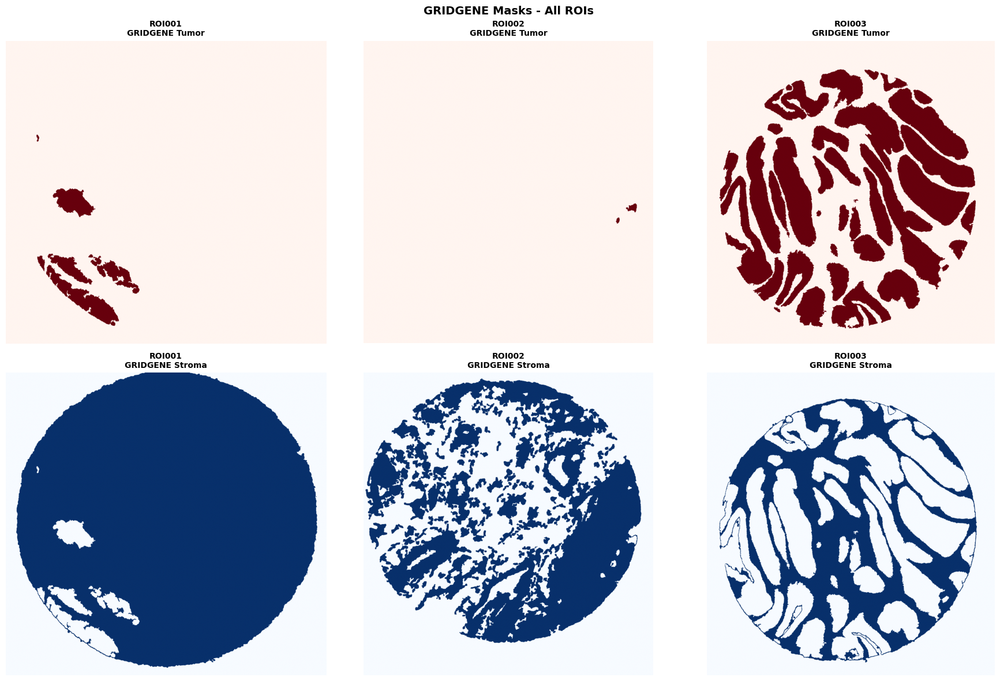

In [63]:
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Row 1: Tumor masks
for idx, roi_name in enumerate(['ROI001', 'ROI002', 'ROI003']):
    masks = xenium_results_transformed[roi_name]
    
    axes[0, idx].imshow(masks['mask_tumor'], cmap='Reds')
    axes[0, idx].set_title(f'{roi_name}\nGRIDGENE Tumor', fontsize=10, fontweight='bold')
    axes[0, idx].axis('off')

# Row 2: Stroma masks
for idx, roi_name in enumerate(['ROI001', 'ROI002', 'ROI003']):
    masks = xenium_results_transformed[roi_name]
    
    axes[1, idx].imshow(masks['mask_stroma'], cmap='Blues')
    axes[1, idx].set_title(f'{roi_name}\nGRIDGENE Stroma', fontsize=10, fontweight='bold')
    axes[1, idx].axis('off')

plt.suptitle('GRIDGENE Masks - All ROIs', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

In [64]:
# ============================================================================
# ANALYZE DISTRIBUTION - Calculate overlap with GRIDGENE masks
# ============================================================================
analysis_results = {}

for roi_name in cell_phenotype_results.keys():
    if not cell_phenotype_results[roi_name].get('success', False):
        continue
    
    cell_phenotypes = cell_phenotype_results[roi_name]['cell_phenotypes']
    
    # Use aligned masks
    gridgene_masks_xenium = {
        'tumor': xenium_results_transformed[roi_name]['mask_tumor'],
        'stroma': xenium_results_transformed[roi_name]['mask_stroma']
    }
    
    analysis = analyze_cell_phenotype_distribution(cell_phenotypes, gridgene_masks_xenium)
    analysis['fov'] = roi_name
    analysis_results[roi_name] = analysis

print(f"✓ Analyzed {len(analysis_results)} ROIs")

df_dist = create_distribution_dataframe(analysis_results)
print(df_dist.head(10))

✓ Analyzed 3 ROIs
      FOV   Cell Type  In GG Tumor  In GG Stroma
0  ROI001  Epithelial    93.628587      6.306699
1  ROI001      Stroma     0.185049     99.806377
2  ROI001      Immune     3.242549     96.757451
3  ROI002  Epithelial    28.720914     66.005783
4  ROI002      Stroma     0.000782     96.501568
5  ROI002      Immune     0.052415     96.443134
6  ROI003  Epithelial    98.720640      1.279360
7  ROI003      Stroma     5.375969     94.624031
8  ROI003      Immune    16.136895     83.863105


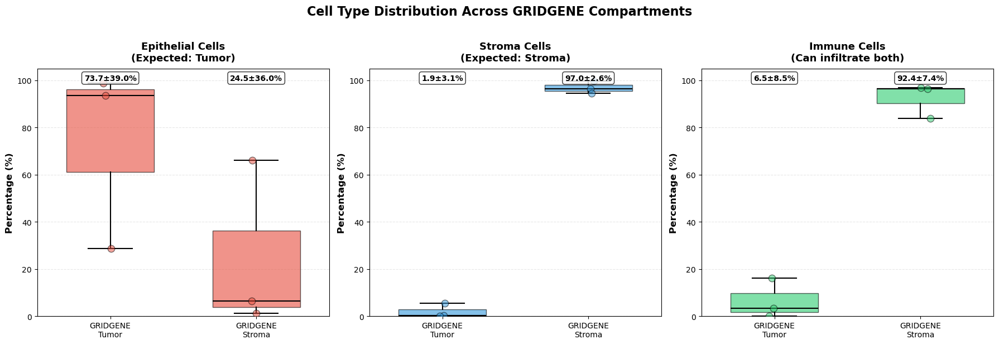

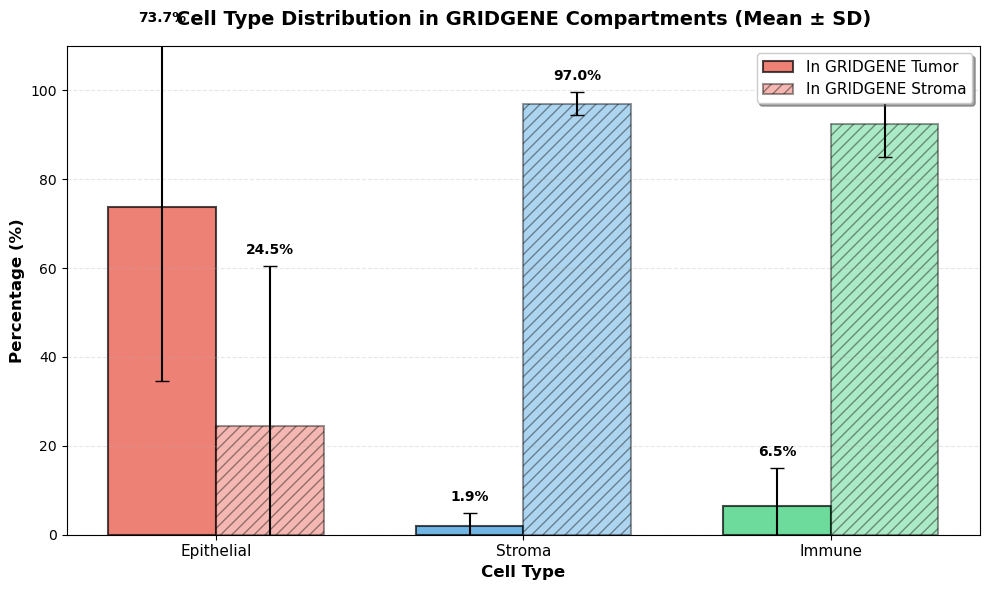

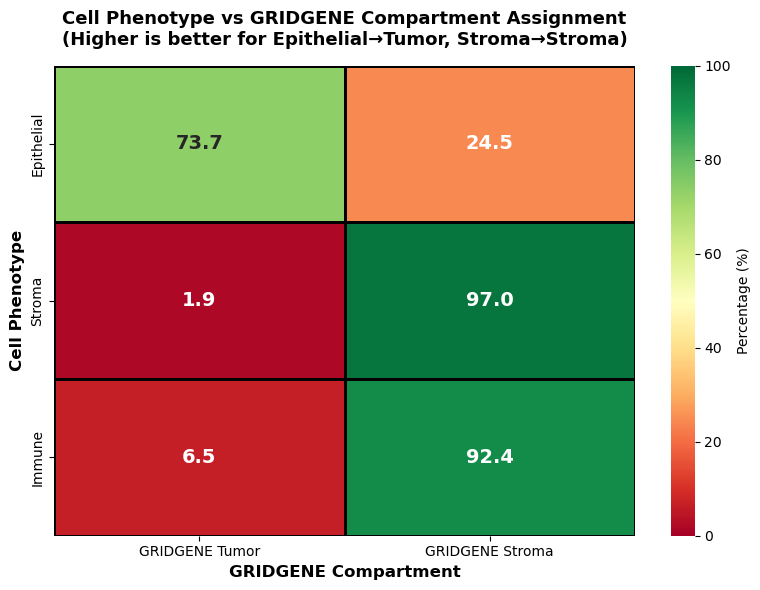

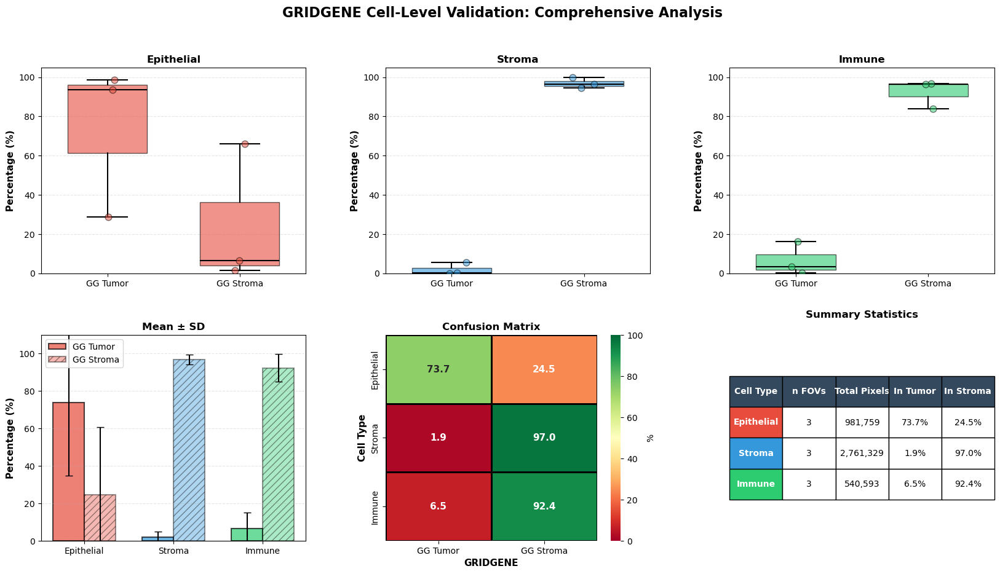


SUMMARY STATISTICS

Epithelial cells:
  In GRIDGENE Tumor:  73.7% ± 39.0%
  In GRIDGENE Stroma: 24.5% ± 36.0%

Stroma cells:
  In GRIDGENE Tumor:  1.9% ± 3.1%
  In GRIDGENE Stroma: 97.0% ± 2.6%

Immune cells:
  In GRIDGENE Tumor:  6.5% ± 8.5%
  In GRIDGENE Stroma: 92.4% ± 7.4%


In [65]:

# A) Boxplot
plot_distribution_boxplot(df_dist, save_path='figures/xenium/cell_validation_boxplot.png')

# B) Bar plot (mean ± SD)
plot_distribution_barplot(df_dist, save_path='figures/xenium/cell_validation_barplot.png')

# C) Confusion heatmap
plot_confusion_heatmap(df_dist, save_path='figures/xenium/cell_validation_heatmap.png')

# D) Comprehensive figure (all in one)
plot_comprehensive_figure(df_dist, analysis_results, save_path='figures/xenium/cell_validation_comprehensive.png')

# ============================================================================
# 7. PRINT SUMMARY STATISTICS
# ============================================================================

print("\n" + "="*80)
print("SUMMARY STATISTICS")
print("="*80)

for cell_type in ['Epithelial', 'Stroma', 'Immune']:
    data = df_dist[df_dist['Cell Type'] == cell_type]
    print(f"\n{cell_type} cells:")
    print(f"  In GRIDGENE Tumor:  {data['In GG Tumor'].mean():.1f}% ± {data['In GG Tumor'].std():.1f}%")
    print(f"  In GRIDGENE Stroma: {data['In GG Stroma'].mean():.1f}% ± {data['In GG Stroma'].std():.1f}%")

Phenotype vs GRIDGENE Validation...



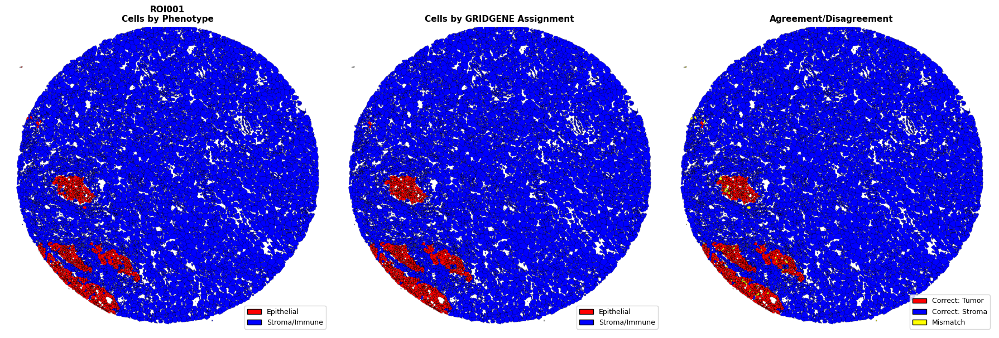


ROI001 - Cell-Level Validation Statistics:
✓ Correct matches: 7250/7316 (99.1%)
  - Epithelial correctly in Tumor:  852 cells
  - Stroma/Immune correctly in Stroma: 6398 cells

✗ Mismatches: 66/7316 (0.9%)
  - Epithelial wrongly in Stroma: 13 cells
  - Stroma/Immune wrongly in Tumor: 53 cells



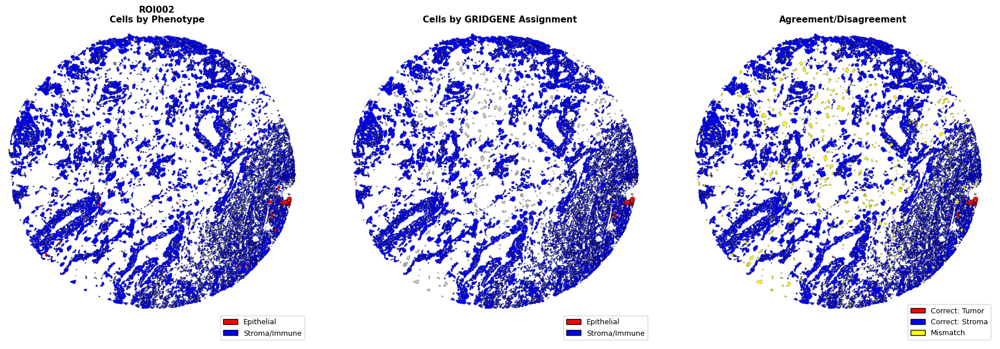


ROI002 - Cell-Level Validation Statistics:
✓ Correct matches: 6620/6671 (99.2%)
  - Epithelial correctly in Tumor:  23 cells
  - Stroma/Immune correctly in Stroma: 6597 cells

✗ Mismatches: 51/6671 (0.8%)
  - Epithelial wrongly in Stroma: 51 cells
  - Stroma/Immune wrongly in Tumor: 0 cells



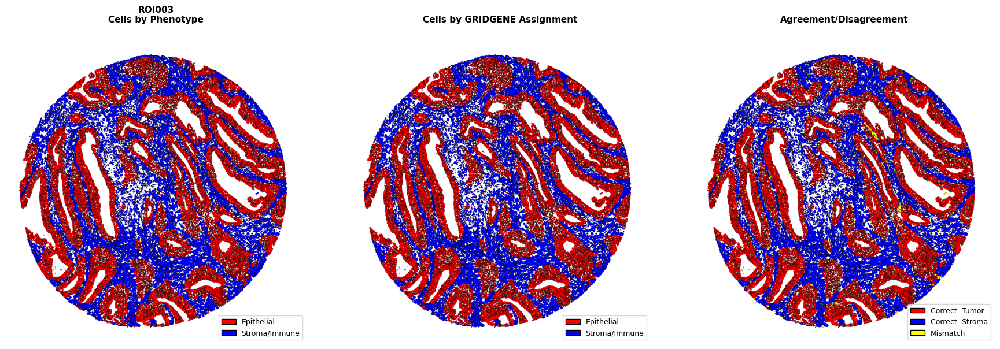


ROI003 - Cell-Level Validation Statistics:
✓ Correct matches: 18960/19522 (97.1%)
  - Epithelial correctly in Tumor:  11932 cells
  - Stroma/Immune correctly in Stroma: 7028 cells

✗ Mismatches: 562/19522 (2.9%)
  - Epithelial wrongly in Stroma: 28 cells
  - Stroma/Immune wrongly in Tumor: 534 cells



In [67]:
def visualize_xenium_phenotype_vs_gridgene(roi_name):
    """
    3-column validation visualization:
    Column 1: Cells by Phenotype (Epithelial vs Stroma/Immune)
    Column 2: Cells by GRIDGENE assignment
    Column 3: Agreement/Disagreement (matching vs mismatch)
    """
    
    if not cell_phenotype_results[roi_name].get('success', False):
        print(f"{roi_name}: No cell data")
        return
    
    # Get data
    cell_phenotypes = cell_phenotype_results[roi_name]['cell_phenotypes']
    gg_tumor = xenium_results_transformed[roi_name]['mask_tumor']
    gg_stroma = xenium_results_transformed[roi_name]['mask_stroma']
    image_shape = gg_tumor.shape
    # Statistics counters
    correct_tumor = 0
    correct_stroma = 0
    epithelial_in_stroma = 0  # Epithelial wrongly in stroma
    stroma_in_tumor = 0       # Stroma/immune wrongly in tumor
    # Create figure
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # Initialize images
    phenotype_img = np.ones((*image_shape, 3), dtype=np.uint8) * 255
    gridgene_img = np.ones((*image_shape, 3), dtype=np.uint8) * 255
    agreement_img = np.ones((*image_shape, 3), dtype=np.uint8) * 255
    
    # Process each cell
    for _, row in cell_phenotypes.iterrows():
        coords = np.array(row['polygon'].exterior.coords, dtype=np.int32)
        compartment = row['compartment']
        
        if pd.isna(compartment):
            continue
        
        # Merge immune with stroma for phenotype
        if compartment == 'immune':
            phenotype_binary = 'Stroma'  # Treat immune as stroma
        elif compartment == 'tumor':
            phenotype_binary = 'Epithelial'
        elif compartment == 'stroma':
            phenotype_binary = 'Stroma'
        else:
            phenotype_binary = 'other'
        
            
        # Create cell mask to check GRIDGENE overlap
        cell_mask_uint8 = np.zeros(image_shape, dtype=np.uint8)
        cv2.fillPoly(cell_mask_uint8, [coords], 1)
        cell_mask = cell_mask_uint8.astype(bool)
        
        tumor_overlap = (cell_mask & gg_tumor.astype(bool)).sum()
        stroma_overlap = (cell_mask & gg_stroma.astype(bool)).sum()
        
        # Determine GRIDGENE assignment (whichever has more overlap)
        if tumor_overlap > stroma_overlap:
            gridgene_assignment = 'Epithelial'
        elif stroma_overlap > tumor_overlap:
            gridgene_assignment = 'Stroma'
        else:
            gridgene_assignment = 'none'
        
        # Column 1: Color by phenotype (merged)
        if phenotype_binary == 'Epithelial':
            phenotype_color = (255, 0, 0)  # Red
        elif phenotype_binary == 'Stroma':
            phenotype_color = (0, 0, 255)  # Blue
        else:
            phenotype_color = (128, 128, 128)  # Gray
        
        cv2.fillPoly(phenotype_img, [coords], phenotype_color)
        cv2.polylines(phenotype_img, [coords], isClosed=True, color=(0, 0, 0), thickness=1)
        
        # Column 2: Color by GRIDGENE assignment
        if gridgene_assignment == 'Epithelial':
            gridgene_color = (255, 0, 0)  # Red
        elif gridgene_assignment == 'Stroma':
            gridgene_color = (0, 0, 255)  # Blue
        else:
            gridgene_color = (200, 200, 200)  # Light gray
        
        cv2.fillPoly(gridgene_img, [coords], gridgene_color)
        cv2.polylines(gridgene_img, [coords], isClosed=True, color=(0, 0, 0), thickness=1)
        
        # Column 3: Agreement/Disagreement
        if phenotype_binary == gridgene_assignment:
            # Match - use correct color
            if phenotype_binary == 'Epithelial':
                agreement_color = (255, 0, 0)  # Red (correct tumor)
                correct_tumor += 1

            else:
                agreement_color = (0, 0, 255)  # Blue (correct stroma)
                correct_stroma += 1

                
        else:
            # Mismatch - use yellow
            agreement_color = (255, 255, 0)  # Yellow (disagreement)
            if phenotype_binary == 'Epithelial' and gridgene_assignment == 'Stroma':
                epithelial_in_stroma += 1
            elif phenotype_binary == 'Stroma' and gridgene_assignment == 'Epithelial':
                stroma_in_tumor += 1
                
                
                
        cv2.fillPoly(agreement_img, [coords], agreement_color)
        cv2.polylines(agreement_img, [coords], isClosed=True, color=(0, 0, 0), thickness=1)
    
    # Display
    axes[0].imshow(phenotype_img)
    axes[0].set_title(f'{roi_name}\nCells by Phenotype', fontsize=11, fontweight='bold')
    axes[0].axis('off')
    
    axes[1].imshow(gridgene_img)
    axes[1].set_title('Cells by GRIDGENE Assignment', fontsize=11, fontweight='bold')
    axes[1].axis('off')
    
    axes[2].imshow(agreement_img)
    axes[2].set_title('Agreement/Disagreement', fontsize=11, fontweight='bold')
    axes[2].axis('off')
    
    # Add legends
    from matplotlib.patches import Patch
    
    # Legend for columns 1 & 2
    binary_legend = [
        Patch(facecolor='red', edgecolor='black', label='Epithelial'),
        Patch(facecolor='blue', edgecolor='black', label='Stroma/Immune')
    ]
    axes[0].legend(handles=binary_legend, loc='lower right', fontsize=9, frameon=True)
    axes[1].legend(handles=binary_legend, loc='lower right', fontsize=9, frameon=True)
    
    # Legend for column 3
    agreement_legend = [
        Patch(facecolor='red', edgecolor='black', label='Correct: Tumor'),
        Patch(facecolor='blue', edgecolor='black', label='Correct: Stroma'),
        Patch(facecolor='yellow', edgecolor='black', label='Mismatch')
    ]
    axes[2].legend(handles=agreement_legend, loc='lower right', fontsize=9, frameon=True)
    
    plt.tight_layout()
    plt.show()
    
        # Print statistics
    total_correct = correct_tumor + correct_stroma
    total_mismatch = epithelial_in_stroma + stroma_in_tumor
    total_cells = total_correct + total_mismatch
    
    print(f"\n{roi_name} - Cell-Level Validation Statistics:")
    print("=" * 60)
    print(f"✓ Correct matches: {total_correct}/{total_cells} ({100*total_correct/total_cells:.1f}%)")
    print(f"  - Epithelial correctly in Tumor:  {correct_tumor} cells")
    print(f"  - Stroma/Immune correctly in Stroma: {correct_stroma} cells")
    print(f"\n✗ Mismatches: {total_mismatch}/{total_cells} ({100*total_mismatch/total_cells:.1f}%)")
    print(f"  - Epithelial wrongly in Stroma: {epithelial_in_stroma} cells")
    print(f"  - Stroma/Immune wrongly in Tumor: {stroma_in_tumor} cells")
    print("=" * 60)



# Visualize all ROIs
print("Phenotype vs GRIDGENE Validation...\n")
for roi_name in ['ROI001', 'ROI002', 'ROI003']:
    if cell_phenotype_results.get(roi_name, {}).get('success', False):
        visualize_xenium_phenotype_vs_gridgene(roi_name)
        print()